In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

import matplotlib.pyplot as plt
%matplotlib inline

import cv2
import numpy as np
from scipy.signal import find_peaks
from itertools import groupby

### Load image

(2287, 440, 3)

<Figure size 1440x2880 with 0 Axes>

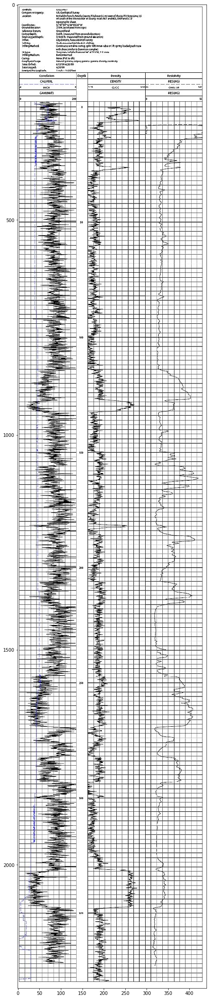

In [2]:
src = cv2.imread('../data/fieldprint.jpg'); src.shape
###
# OpenCV uses BGR as its default colour order for images, matplotlib uses RGB. 
# When you display an image loaded with OpenCv in matplotlib the channels will be back to front.
# The easiest way of fixing this is to use OpenCV to explicitly convert it back to RGB
###

plt.figure(figsize=(20,40))
_ = plt.imshow(src)

### BGR to Gray scale

In [3]:
# Transform source image to gray if it is not already
if len(src.shape) != 2:
    gray = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
else:
    gray = src

<Figure size 1440x2880 with 0 Axes>

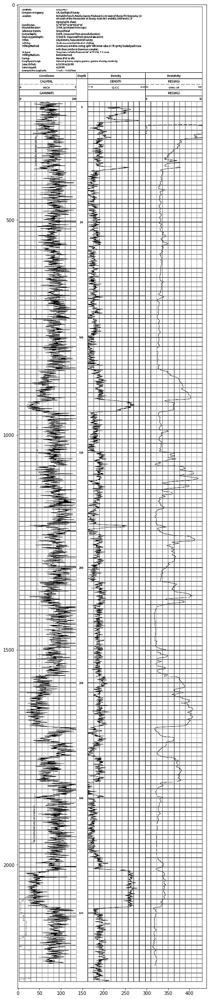

In [4]:
plt.figure(figsize=(20,40))
_ = plt.imshow(gray, cmap='gray')

### Gray scale to Binary

In [5]:
# Apply adaptiveThreshold at the bitwise_not of gray, notice the ~ symbol
gray = cv2.bitwise_not(gray)
bw = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 15, -2)

<Figure size 1440x2880 with 0 Axes>

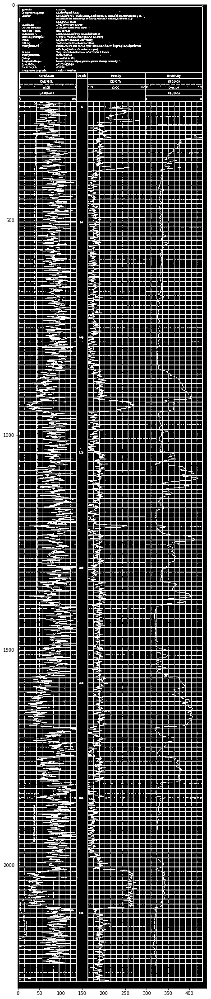

In [6]:
plt.figure(figsize=(20,40))
_ = plt.imshow(bw, cmap='gray')

### Append image to itself to make an image with 2 grid areas

(4574, 440)

<Figure size 1440x2880 with 0 Axes>

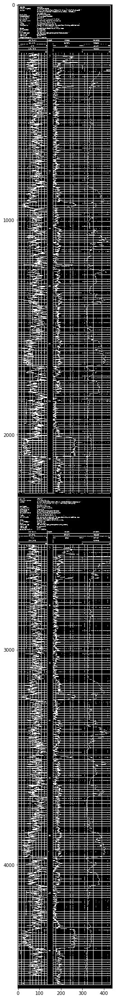

In [7]:
bw2 = np.append(bw, bw, axis=0); bw2.shape

plt.figure(figsize=(20,40))
_ = plt.imshow(bw2, cmap='gray')

### Histogram

In [8]:
bw2.shape
vertSum = np.sum(bw2,0)
horzSum = np.sum(bw2,1)

(4574, 440)

<Figure size 1440x360 with 0 Axes>

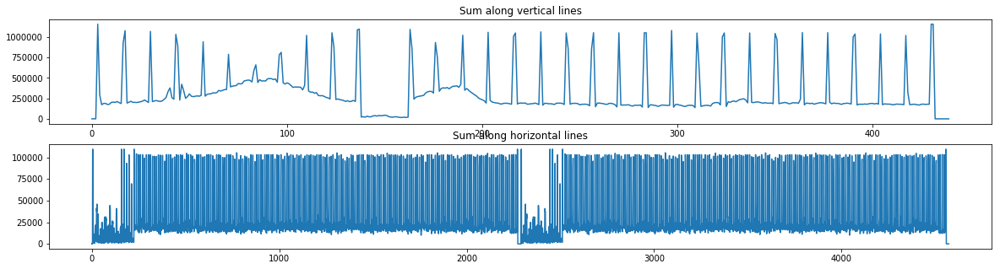

In [9]:
plt.figure(figsize=(20, 5))

_ = plt.subplot(2,1,1)
_ = plt.plot(vertSum)
_ = plt.title('Sum along vertical lines')

_ = plt.subplot(2,1,2)
_ = plt.plot(horzSum)
_ = plt.title('Sum along horizontal lines')

### Find Peaks

<Figure size 1440x360 with 0 Axes>

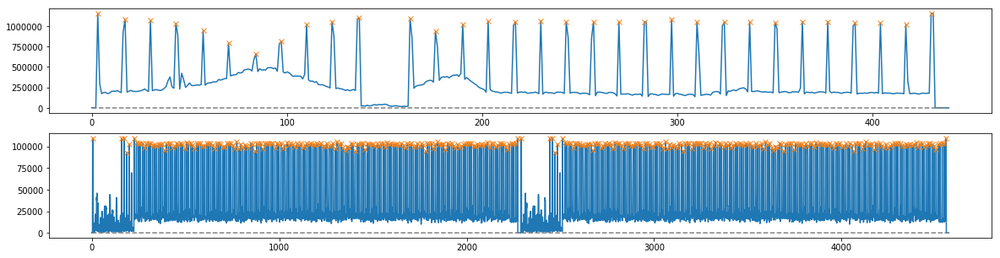

In [10]:
plt.figure(figsize=(20, 5))

v = vertSum.copy();
v_peaks, _ = find_peaks(v, distance=10, height=200000); 
_ = plt.subplot(2,1,1)
_ = plt.plot(v)
_ = plt.plot(v_peaks, v[v_peaks], "x")
_ = plt.plot(np.zeros_like(v), "--", color="gray")

h = horzSum.copy();
h_peaks, _ = find_peaks(h, height=75000); 
_ = plt.subplot(2,1,2)
_ = plt.plot(h)
_ = plt.plot(h_peaks, h[h_peaks], "x")
_ = plt.plot(np.zeros_like(h), "--", color="gray")


### Find areas with many lines

In [17]:
def getDiffMask(peaks, lower, upper):
    peaks_diff = np.diff(peaks); print(peaks_diff)
    peaks_diff_mask = np.greater(peaks_diff, lower) & np.less(peaks_diff, upper)
    
    return(peaks_diff_mask)

### Get areas with many horizontal lines

In [18]:
h = horzSum.copy()
h_peaks, _ = find_peaks(h, height=75000); #print(h_peaks);
lower = 8
upper = 12

h_peaks_diff_mask = getDiffMask(h_peaks, lower, upper); #h_peaks_diff_mask

[153  13  14  13  27  13  10  11  11  11  10  11  11  11  10  11  10  11
  11  11  10  11  11  11  10  11  10  11  11  11  10  11  11  11  10  11
  11  10  11  11  11  10  11  11  10  11  11  10  11  11  11  10  11  11
  10  11  11  11  10  11  11  10  11  11  11  10  11  11  10  11  11  10
  11  11  11  10  11  11  10  11  11  11  10  11  11  10  11  11  11  10
  11  10  11  11  11  10  11  11  11  10  11  11  10  11  11  10  11  11
  11  10  11  11  10  11  11  11  10  11  11  10  11  11  11  10  11  11
  10  11  11  11  10  11  11  10  11  11  10  11  11  11  10  11  11  11
  10  11  11  10  11  11  10  11  11  11  10  11  11  10  11  11  11  10
  11  11  11  10  10  11  11  11  11  10  11  11  11  10  11  10  11  11
  11  10  11  11  11  10  11  11  10  11  11  10  11  11  11   9  21 153
  13  14  13  27  13  10  11  11  11  10  11  11  11  10  11  10  11  11
  11  10  11  11  11  10  11  10  11  11  11  10  11  11  11  10  11  11
  10  11  11  11  10  11  11  10  11  11  10  11  1

### Get areas with many vertical lines

In [19]:
v = vertSum.copy()
v_peaks, _ = find_peaks(v, distance=10, height=200000); v_peaks
lower = 12
upper = 15

v_peaks_diff_mask = getDiffMask(v_peaks, lower, upper); v_peaks_diff_mask

array([  3,  17,  30,  43,  57,  70,  84,  97, 110, 123, 137, 163, 176,
       190, 203, 217, 230, 243, 257, 270, 283, 297, 310, 324, 337, 350,
       364, 377, 391, 404, 417, 430])

[14 13 13 14 13 14 13 13 13 14 26 13 14 13 14 13 13 14 13 13 14 13 14 13
 13 14 13 14 13 13 13]


array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

### Get location that has n number of consecutive lines

In [20]:
def getLocWithManyLines(diff_mask, n):
    grouped_data = groupby(enumerate(diff_mask), key=lambda x: x[-1])

    locWithManyLines = []

    for k, g in grouped_data:
        g = list(g)

        if k == True and len(g) > n: # more than n consecutive lines
            locWithManyLines.append((g[0][0], g[-1][0]))

    return(locWithManyLines)   

In [21]:
locWithVertLines = getLocWithManyLines(v_peaks_diff_mask, 8); locWithVertLines

locWithHorzLines = getLocWithManyLines(h_peaks_diff_mask, 8); locWithHorzLines

[(0, 9), (11, 30)]

[(6, 195), (203, 392)]

### Display

<Figure size 3600x7200 with 0 Axes>

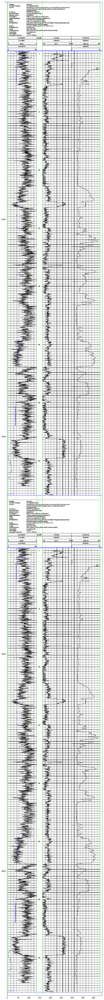

In [57]:
new = src.copy(); #new.shape
new = np.append(new, new, axis=0); #new.shape

for item in locWithVertLines: # item[0] is start, item[1] is end
    #print(item[0], item[1], v_peaks[item[0]], v_peaks[item[1]])
    new[:,v_peaks[item[0]],:] = (0,255,0)
    new[:, v_peaks[item[1]+1],:] = (0,255,0)

for item in locWithHorzLines:
    #print(item)
    new[h_peaks[item[0]-1],:,:] = (0,0,255)
    new[h_peaks[item[1]+1],:,:] = (0,0,255)
    
plt.figure(figsize=(50,100))
_ = plt.imshow(new)


## Putting all together

In [20]:
def getCoordWithManyLines(array, axis, distance, height, lower, upper, n):
    '''
    Implements locate coordinates where many lines exist in a local region by means of histogram.
    
    Argument:
        array = 2D array to be processed, e.g. a binary image array
        axis = 0 for vertical lines, 1 for horizontal lines
        distance = distance between peaks of an histogram
        height = minimum height of peaks required of an histogram
        lower = lower limit of spacing between peaks
        upper = upper limit of spacing between peaks
        n = minimum number of consecutive lines required
    
    Return:
        locWithManyLines = return a list of a pair of indexes, indicating the start and end of area of interest 
    '''
    
    # Sum over an axis
    axis_sum = np.sum(array, axis); #print(axis_sum.shape)

    # Find peaks
    peaks, _ = find_peaks(axis_sum, distance=distance, height=height); #print(peaks)
    
    # Get the distance between peaks
    peaks_diff = np.diff(peaks); #print(peaks_diff)
    
    # Filter peaks that satisfied spacing specified by `lower` and `upper`
    peaks_diff_mask = np.greater(peaks_diff, lower) & np.less(peaks_diff, upper); #print(peaks_diff_mask)
    
    # Grouped by distance between peaks
    grouped_data = groupby(enumerate(peaks_diff_mask), key=lambda x: x[-1])

    locWithManyLines = []

    # Locate area where there are more than n number of consecutive lines
    for k, g in grouped_data:
        g = list(g)

        if k == True and len(g) > n: # more than n consecutive lines
            locWithManyLines.append((peaks[g[0][0]], peaks[g[-1][0]+1]))

    return(coordWithManyLines)  

### Locate vertical lines

In [21]:
loc_v = getCoordWithManyLines(array=bw2, axis=0, distance=10, height=200000, lower=12, upper=15, n=8); loc_v

[(3, 137), (163, 430)]

### Locate horizontal lines

In [23]:
loc_h = getCoordWithManyLines(array=bw2, axis=1, distance=None, height=75000, lower=8, upper=12, n=8); loc_h

[(238, 2271), (2525, 4558)]

### Extract `top_left` and `bottom_right` of grid location

In [24]:
def getBBoxes(vertlines_coordinates, horzlines_coordinates):
    """
    Implements extraction of grid region give coordinates of multiple start and end of vertical and horizontal lines.
    
    Arguments:
        vertlines_coordinates, horzlines_coordinates
        
    Return:
    A list of coordinates defining the top left and botton right of a list of grid areas.
    
    """
    grid_list = []

    for h in horzlines_coordinates:
        for v in vertlines_coordinates:
            top_left = v[0], h[0]
            bottom_right = v[1], h[1]
            grid_list.append([top_left, bottom_right])
    
    return(grid_list)

In [25]:
grid_list = getBBoxes(loc_v, loc_h); grid_list

[[(3, 238), (137, 2271)],
 [(163, 238), (430, 2271)],
 [(3, 2525), (137, 4558)],
 [(163, 2525), (430, 4558)]]

### Display

<Figure size 3600x7200 with 0 Axes>

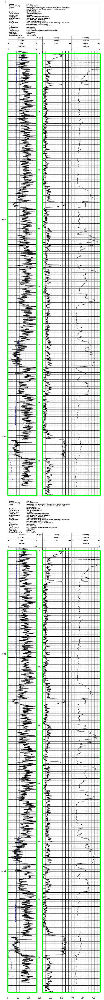

In [26]:
new = src.copy(); #new.shape
new = np.append(new, new, axis=0); #new.shape

for g in grid_list:
    top_left = g[0]
    bottom_right = g[1]
    new = cv2.rectangle(new, (top_left[0], top_left[1]), (bottom_right[0], bottom_right[1]), (0,255,0), 4)
    
plt.figure(figsize=(50,100))
_ = plt.imshow(new)

#cv2.imwrite('../data/extract_graph.jpg',new)